# TDA-Enhanced Bollinger Bands Reversion
## Estrategia: Homología Persistente + Distancia de Wasserstein + Bandas de Bollinger

Esta libreta implementa la estrategia de **Kevin: Bollinger Bands Reversion** enriquecida con
**Topological Data Analysis (TDA)** como filtro de régimen de mercado.

### Pipeline
```
OHLCV ──► Log-Returns ──► Takens Embedding ──► Homología Persistente
                                                        │
                                           Distancia de Wasserstein (ventana deslizante)
                                                        │
                                    W-dist BAJA  →  Régimen estable  →  BB entra
                                    W-dist ALTA  →  Cambio de régimen →  No entrar
```

### Hipótesis
La distancia de Wasserstein entre diagramas de persistencia consecutivos mide cuánto cambia
la **topología del mercado**. Un mercado en **régimen estable** (W-dist baja) es propicio
para reversión a la media. Un mercado en **transición** (W-dist alta) indica tendencia o
shock — señal de evitar entradas.

---
**Datos:** Binance OHLCV — parquet (freqtrade format)  
**Par principal:** BTC/USDT 15m  

## 1. Configuración e Instalación

In [1]:
import subprocess, sys

def _pip_install(pkg):
    subprocess.check_call([sys.executable, "-m", "pip", "install", pkg, "-q"])

for pkg_name, import_name in [("ripser", "ripser"), ("persim", "persim")]:
    try:
        __import__(import_name)
        print(f"✓ {pkg_name} ya instalado")
    except ImportError:
        print(f"Instalando {pkg_name}...")
        _pip_install(pkg_name)
        print(f"✓ {pkg_name} instalado")

✓ ripser ya instalado
✓ persim ya instalado


In [2]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch
from pathlib import Path

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from ripser import ripser
from persim import wasserstein, plot_diagrams

try:
    from tqdm.notebook import tqdm
except ImportError:
    from tqdm import tqdm

plt.rcParams["figure.dpi"] = 110
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

print("✓ Todos los imports OK")

✓ Todos los imports OK


In [3]:
# ================================================================
# PARÁMETROS — ajusta aquí sin tocar el resto de la libreta
# ================================================================

# --- Datos ---
DATA_DIR   = Path("../freqtrade/user_data/data/binance")
PAIR       = "BTC_USDT"
TIMEFRAME  = "15m"
N_CANDLES  = 20_000   # Últimas N velas. None = todas (140k, puede tardar)

# --- Bollinger Bands ---
BB_WINDOW  = 20
BB_STD     = 2.0

# --- TDA ---
TAKENS_DIM          = 2    # Dimensión del embedding de Takens
TAKENS_TAU          = 1    # Delay entre coordenadas
TDA_WINDOW          = 60   # Velas por diagrama de persistencia
TDA_STRIDE          = 10   # Calcular TDA cada N velas (mayor = más rápido)
W_THRESHOLD_PCTILE  = 40   # Percentil W-dist para régimen estable

# --- Backtest ---
COMMISSION      = 0.001     # 0.1% por operación (Binance taker)
INITIAL_CAPITAL = 10_000    # USD
PERIODS_PER_YEAR = 365 * 24 * 4  # 35 040 velas de 15 min por año

print("Parámetros:")
print(f"  Par:              {PAIR}-{TIMEFRAME}")
print(f"  Velas a usar:     {N_CANDLES:,}")
print(f"  BB:               SMA({BB_WINDOW}) ± {BB_STD}σ")
print(f"  Takens:           dim={TAKENS_DIM}, τ={TAKENS_TAU}")
print(f"  TDA window:       {TDA_WINDOW} velas, stride={TDA_STRIDE}")
print(f"  Umbral W-dist:    percentil {W_THRESHOLD_PCTILE}")
print(f"  Comisión:         {COMMISSION*100:.1f}% por lado")

Parámetros:
  Par:              BTC_USDT-15m
  Velas a usar:     20,000
  BB:               SMA(20) ± 2.0σ
  Takens:           dim=2, τ=1
  TDA window:       60 velas, stride=10
  Umbral W-dist:    percentil 40
  Comisión:         0.1% por lado


## 2. Carga de Datos y EDA

In [4]:
fpath = DATA_DIR / f"{PAIR}-{TIMEFRAME}.parquet"
df = pd.read_parquet(fpath)
df = df.set_index("date").sort_index()

if N_CANDLES:
    df = df.tail(N_CANDLES).copy()
else:
    df = df.copy()

print(f"Par:     {PAIR} {TIMEFRAME}")
print(f"Forma:   {df.shape[0]:,} velas × {df.shape[1]} columnas")
print(f"Período: {df.index[0].strftime('%Y-%m-%d')} → {df.index[-1].strftime('%Y-%m-%d')}")
print(f"Precio:  ${df['close'].min():,.2f} – ${df['close'].max():,.2f}")
df.head(3)

Par:     BTC_USDT 15m
Forma:   20,000 velas × 5 columnas
Período: 2025-10-19 → 2026-05-15
Precio:  $60,255.65 – $116,053.49


,open,high,low,close,volume
date,,,,,
2025-10-19 15:45:00+00:00,108364.76,108486.71,108364.76,108486.70,44.52746
2025-10-19 16:00:00+00:00,108486.71,108521.44,108310.00,108340.96,67.36118
2025-10-19 16:15:00+00:00,108340.96,108373.12,108240.00,108346.07,86.45673


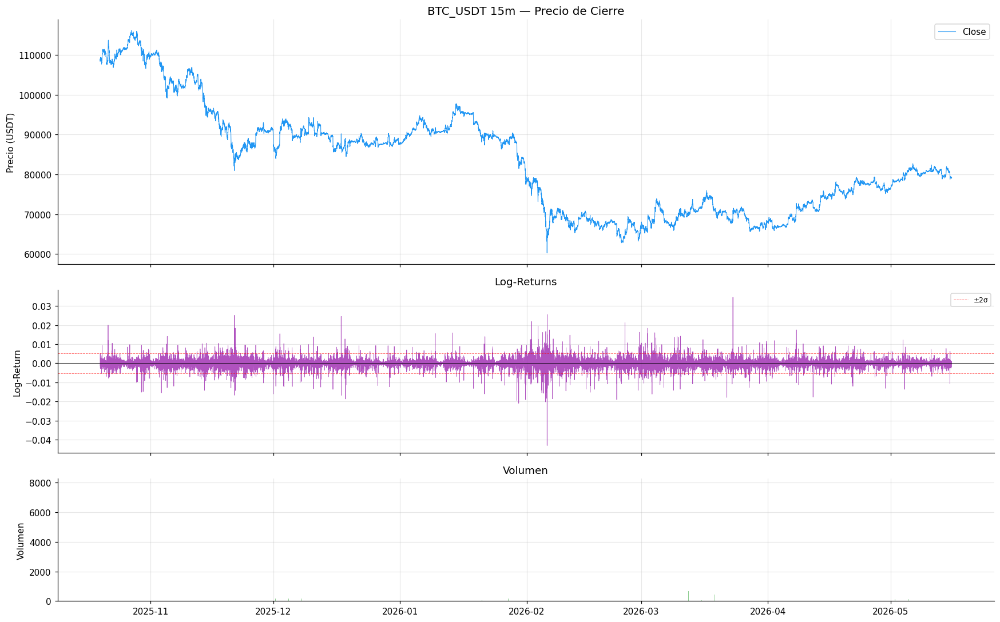


Estadísticas de log-returns:
count    19999.000000
mean        -0.000016
std          0.002601
min         -0.043107
25%         -0.001084
50%          0.000000
75%          0.001095
max          0.034581


In [5]:
log_ret = np.log(df["close"] / df["close"].shift(1)).dropna()

fig, axes = plt.subplots(3, 1, figsize=(16, 10), sharex=True,
                         gridspec_kw={"height_ratios": [3, 2, 1.5]})

# Precio
axes[0].plot(df.index, df["close"], color="#2196F3", linewidth=0.7, label="Close")
axes[0].set_ylabel("Precio (USDT)")
axes[0].set_title(f"{PAIR} {TIMEFRAME} — Precio de Cierre", fontsize=13)
axes[0].legend()
axes[0].grid(alpha=0.3)

# Log-returns
axes[1].plot(log_ret.index, log_ret, color="#9C27B0", linewidth=0.5, alpha=0.8)
axes[1].axhline(0, color="black", linewidth=0.5)
axes[1].axhline(log_ret.mean() + 2*log_ret.std(), color="red", linewidth=0.6,
                linestyle="--", alpha=0.6, label="±2σ")
axes[1].axhline(log_ret.mean() - 2*log_ret.std(), color="red", linewidth=0.6,
                linestyle="--", alpha=0.6)
axes[1].set_ylabel("Log-Return")
axes[1].set_title("Log-Returns")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

# Volumen
axes[2].bar(df.index, df["volume"], color="#4CAF50", alpha=0.6, width=0.00008)
axes[2].set_ylabel("Volumen")
axes[2].set_title("Volumen")
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\nEstadísticas de log-returns:")
print(log_ret.describe().round(6).to_string())

## 3. Indicadores Técnicos: Bollinger Bands

**Bollinger Bands Reversion (Kevin):**
- **Upper band** = SMA(20) + 2σ → zona de sobrecompra → candidato SHORT
- **Lower band** = SMA(20) - 2σ → zona de sobreventa → candidato LONG
- **%B** indica la posición relativa del precio dentro de las bandas

Sin filtro adicional, estas señales tienen alta tasa de falsos positivos en mercados en tendencia.
El TDA actúa como filtro: **solo entramos cuando el mercado está topológicamente estable**.

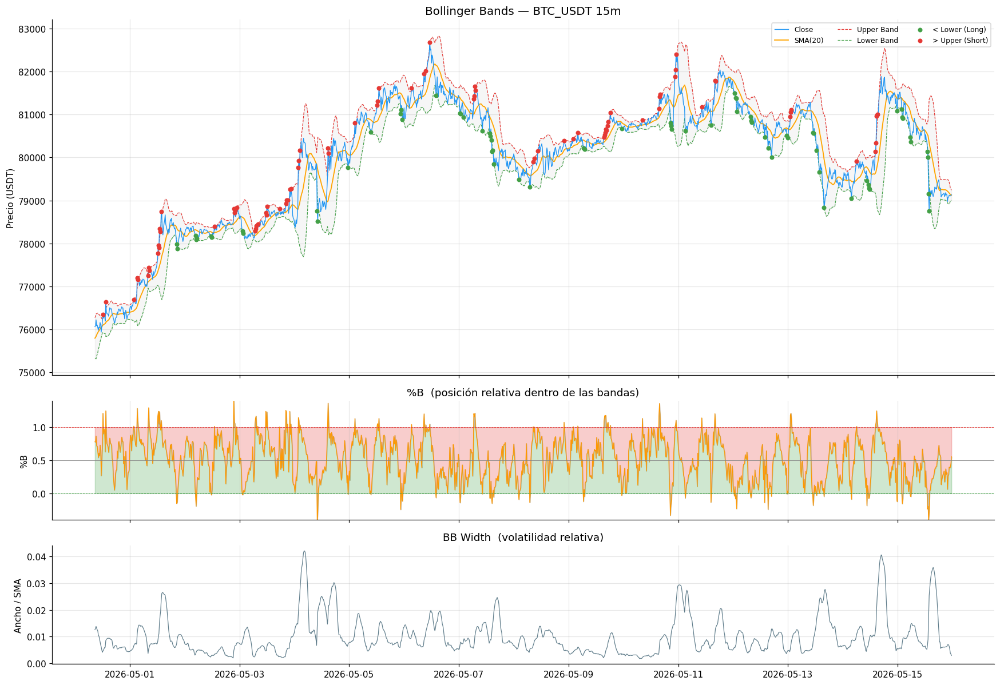

In [6]:
df["sma"]      = df["close"].rolling(BB_WINDOW).mean()
df["bb_std"]   = df["close"].rolling(BB_WINDOW).std()
df["bb_upper"] = df["sma"] + BB_STD * df["bb_std"]
df["bb_lower"] = df["sma"] - BB_STD * df["bb_std"]
df["bb_width"] = (df["bb_upper"] - df["bb_lower"]) / df["sma"]
df["bb_pct"]   = (df["close"] - df["bb_lower"]) / (df["bb_upper"] - df["bb_lower"])

plot_slice = df.dropna(subset=["sma"]).tail(1500)

fig, axes = plt.subplots(3, 1, figsize=(16, 11), sharex=True,
                         gridspec_kw={"height_ratios": [3, 1, 1]})

# --- Precio + BB ---
axes[0].plot(plot_slice.index, plot_slice["close"],    color="#2196F3", lw=0.9, label="Close", zorder=3)
axes[0].plot(plot_slice.index, plot_slice["sma"],      color="orange",  lw=1.2, label=f"SMA({BB_WINDOW})", zorder=2)
axes[0].plot(plot_slice.index, plot_slice["bb_upper"], color="#E53935", lw=0.8, ls="--", label="Upper Band")
axes[0].plot(plot_slice.index, plot_slice["bb_lower"], color="#43A047", lw=0.8, ls="--", label="Lower Band")
axes[0].fill_between(plot_slice.index, plot_slice["bb_lower"], plot_slice["bb_upper"],
                     alpha=0.07, color="gray")

below = plot_slice[plot_slice["close"] < plot_slice["bb_lower"]]
above = plot_slice[plot_slice["close"] > plot_slice["bb_upper"]]
axes[0].scatter(below.index, below["close"], color="#43A047", s=18, zorder=5, label="< Lower (Long)")
axes[0].scatter(above.index, above["close"], color="#E53935", s=18, zorder=5, label="> Upper (Short)")

axes[0].set_ylabel("Precio (USDT)")
axes[0].set_title(f"Bollinger Bands — {PAIR} {TIMEFRAME}", fontsize=13)
axes[0].legend(fontsize=8, ncol=3)
axes[0].grid(alpha=0.3)

# --- %B ---
axes[1].plot(plot_slice.index, plot_slice["bb_pct"], color="#FF9800", lw=0.8)
axes[1].axhline(1.0, color="#E53935", lw=0.6, ls="--")
axes[1].axhline(0.0, color="#43A047", lw=0.6, ls="--")
axes[1].axhline(0.5, color="gray",    lw=0.5)
axes[1].fill_between(plot_slice.index, 1, plot_slice["bb_pct"].clip(upper=1.4),
                     alpha=0.25, color="#E53935")
axes[1].fill_between(plot_slice.index, plot_slice["bb_pct"].clip(lower=-0.4), 0,
                     alpha=0.25, color="#43A047")
axes[1].set_ylim(-0.4, 1.4)
axes[1].set_ylabel("%B")
axes[1].set_title("%B  (posición relativa dentro de las bandas)")
axes[1].grid(alpha=0.3)

# --- BB Width ---
axes[2].plot(plot_slice.index, plot_slice["bb_width"], color="#607D8B", lw=0.8)
axes[2].set_ylabel("Ancho / SMA")
axes[2].set_title("BB Width  (volatilidad relativa)")
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## 4. Preprocesamiento TDA: Takens Embedding

El **embedding de Takens** (Takens' Delay Embedding Theorem, 1981) permite reconstruir
la dinámica de un sistema a partir de una sola serie temporal 1D, proyectándola a un
espacio de fases de mayor dimensión.

Para **dim=2** y **τ=1** sobre log-returns:
$$\mathbf{x}_t = (r_t,\; r_{t+\tau}) \in \mathbb{R}^2$$

Esto crea una **nube de puntos** cuya forma geométrica captura el régimen del mercado:
- **Elipse / ciclo** → comportamiento mean-reverting (ideal para BB)
- **Línea diagonal** → tendencia fuerte
- **Nube amorfa** → ruido puro

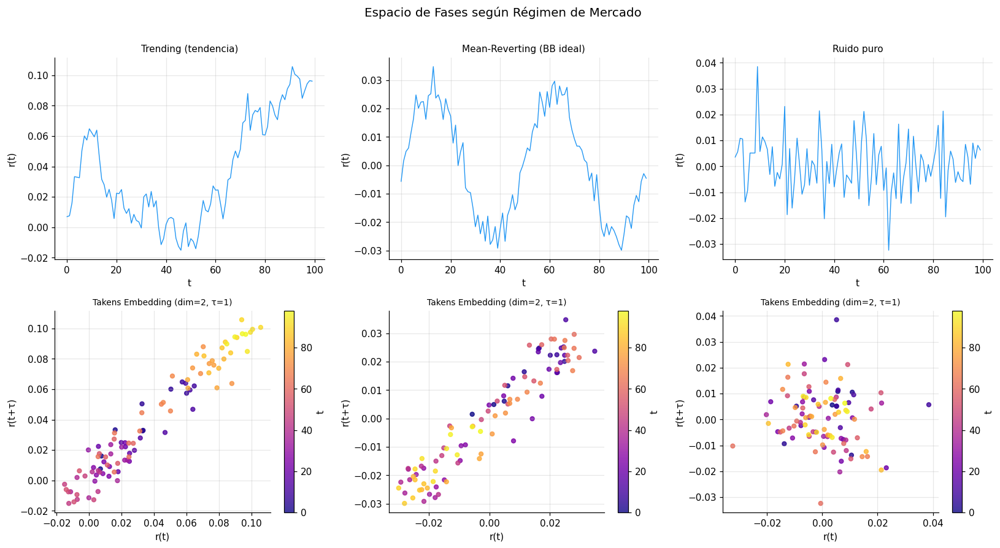

Fila superior: serie original | Fila inferior: espacio de fases
→ El mean-reverting forma una estructura cíclica (elipse)
→ Esta estructura genera ciclos persistentes en H1 (homología)


In [7]:
def takens_embedding(series: np.ndarray, dim: int = 2, tau: int = 1) -> np.ndarray:
    """Takens delay embedding: serie 1D → nube de puntos en R^dim."""
    n = len(series)
    N = n - (dim - 1) * tau
    if N <= 0:
        return np.empty((0, dim))
    return np.array([
        series[i : i + (dim - 1) * tau + 1 : tau]
        for i in range(N)
    ])


# Demo visual con 3 regímenes sintéticos
np.random.seed(42)
t = np.linspace(0, 4 * np.pi, 100)

regimes = {
    "Trending (tendencia)": np.cumsum(np.random.normal(0.002, 0.01, 100)),
    "Mean-Reverting (BB ideal)": 0.025 * np.sin(t) + np.random.normal(0, 0.004, 100),
    "Ruido puro": np.random.normal(0, 0.01, 100),
}

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for col, (name, series) in enumerate(regimes.items()):
    emb = takens_embedding(series, dim=2, tau=1)

    axes[0, col].plot(series, color="#2196F3", lw=0.9)
    axes[0, col].set_title(name, fontsize=10)
    axes[0, col].set_xlabel("t")
    axes[0, col].set_ylabel("r(t)")
    axes[0, col].grid(alpha=0.3)

    sc = axes[1, col].scatter(emb[:, 0], emb[:, 1],
                              c=np.arange(len(emb)), cmap="plasma",
                              s=20, alpha=0.8)
    plt.colorbar(sc, ax=axes[1, col], label="t")
    axes[1, col].set_title(f"Takens Embedding (dim=2, τ=1)", fontsize=9)
    axes[1, col].set_xlabel("r(t)")
    axes[1, col].set_ylabel("r(t+τ)")
    axes[1, col].grid(alpha=0.3)

plt.suptitle("Espacio de Fases según Régimen de Mercado", fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

print("Fila superior: serie original | Fila inferior: espacio de fases")
print("→ El mean-reverting forma una estructura cíclica (elipse)")
print("→ Esta estructura genera ciclos persistentes en H1 (homología)")

## 5. Homología Persistente

La **homología persistente** analiza la nube de puntos a múltiples escalas,
identificando características topológicas que "persisten" (nacen y mueren con el radio
del complejo de Vietoris-Rips):

| Grupo | Significado | Interpretación financiera |
|-------|-------------|---------------------------|
| **H₀** | Componentes conexas | Agrupaciones de precios (peaks/valleys) |
| **H₁** | Ciclos (loops) | Estructuras cíclicas = mean-reversion |

Los puntos más **lejanos de la diagonal** en el diagrama de persistencia representan
características más persistentes y significativas.

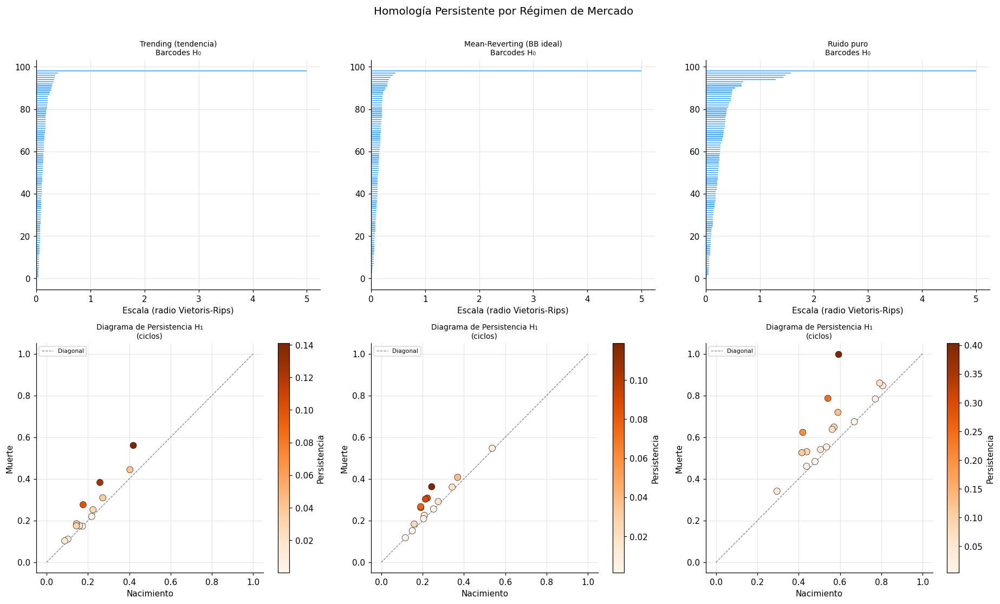

H₁ del régimen mean-reverting tiene puntos más alejados de la diagonal
→ Indica ciclos más persistentes = mayor potencial de reversión


In [8]:
fig, axes = plt.subplots(2, 3, figsize=(17, 10))

regime_data = {}
for col, (name, series) in enumerate(regimes.items()):
    emb  = takens_embedding(series, dim=2, tau=1)
    std  = emb.std(axis=0)
    std[std == 0] = 1.0
    emb_norm = (emb - emb.mean(axis=0)) / std

    dgms = ripser(emb_norm, maxdim=1)["dgms"]
    regime_data[name] = dgms

    # Barcodes H0
    ax = axes[0, col]
    for i, (b, d) in enumerate(dgms[0]):
        d_plot = min(d, 5.0) if np.isinf(d) else d
        ax.barh(i, d_plot - b, left=b, height=0.6,
                color="#2196F3", alpha=0.7)
    ax.set_xlabel("Escala (radio Vietoris-Rips)")
    ax.set_title(f"{name}\nBarcodes H₀", fontsize=9)
    ax.grid(alpha=0.3)

    # Diagrama H1
    ax = axes[1, col]
    if len(dgms[1]) > 0:
        births = dgms[1][:, 0]
        deaths = np.where(np.isinf(dgms[1][:, 1]), births.max() * 1.2, dgms[1][:, 1])
        persistence = deaths - births
        sc = ax.scatter(births, deaths, c=persistence, cmap="Oranges",
                        s=60, zorder=4, edgecolors="black", linewidths=0.4)
        plt.colorbar(sc, ax=ax, label="Persistencia")
    diag_max = max(1.0, dgms[0][:, 0].max() if len(dgms[0]) > 0 else 1.0)
    ax.plot([0, diag_max], [0, diag_max], "k--", lw=0.8, alpha=0.5, label="Diagonal")
    ax.set_xlabel("Nacimiento")
    ax.set_ylabel("Muerte")
    ax.set_title(f"Diagrama de Persistencia H₁\n(ciclos)", fontsize=9)
    ax.legend(fontsize=7)
    ax.grid(alpha=0.3)

plt.suptitle("Homología Persistente por Régimen de Mercado", fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

print("H₁ del régimen mean-reverting tiene puntos más alejados de la diagonal")
print("→ Indica ciclos más persistentes = mayor potencial de reversión")

## 6. Distancia de Wasserstein (Ventana Deslizante)

La **distancia de Wasserstein** (también llamada Earth Mover's Distance) entre dos
diagramas de persistencia mide el costo mínimo de "transportar" los puntos de un
diagrama al otro.

Aplicada en **ventana deslizante** sobre la serie temporal:
$$W_t = W_p\bigl(\text{Dgm}(t-k, t),\;\text{Dgm}(t, t+k)\bigr)$$

- **$W_t$ baja** → la topología del mercado no cambió → régimen estable
- **$W_t$ alta** → la topología cambió bruscamente → cambio de régimen

> **Nota de cómputo:** Con `TDA_STRIDE=10` sobre 20k velas se calculan ~2000 pares de diagramas.  
> Tiempo estimado: 2-5 minutos.

In [9]:
log_ret_vals = np.log(df["close"] / df["close"].shift(1)).fillna(0).values
n_total = len(log_ret_vals)

tda_indices = list(range(TDA_WINDOW, n_total, TDA_STRIDE))

wasserstein_distances = []
tda_idx_valid = []
prev_dgm_h1 = None

print(f"Calculando {len(tda_indices):,} diagramas de persistencia...")

for idx in tqdm(tda_indices, desc="TDA sliding window"):
    window = log_ret_vals[idx - TDA_WINDOW : idx]

    pts = takens_embedding(window, dim=TAKENS_DIM, tau=TAKENS_TAU)
    if len(pts) < 5:
        continue

    # Normalizar por ventana (z-score)
    std = pts.std(axis=0)
    std[std == 0] = 1.0
    pts_norm = (pts - pts.mean(axis=0)) / std

    dgms = ripser(pts_norm, maxdim=1)["dgms"]
    dgm_h1 = dgms[1]

    # Distancia de Wasserstein vs diagrama anterior
    if prev_dgm_h1 is not None:
        w_dist = wasserstein(prev_dgm_h1, dgm_h1)
    else:
        w_dist = 0.0

    wasserstein_distances.append(w_dist)
    tda_idx_valid.append(idx)
    prev_dgm_h1 = dgm_h1

print(f"\n✓ {len(wasserstein_distances):,} distancias calculadas")

Calculando 1,994 diagramas de persistencia...


TDA sliding window:   0%|          | 0/1994 [00:00<?, ?it/s]


✓ 1,994 distancias calculadas


In [10]:
# Alinear W-dist con el índice temporal (sparse → dense, forward-fill)
w_sparse = pd.Series(
    wasserstein_distances,
    index=df.index[tda_idx_valid],
    name="w_dist"
)
df["w_dist"] = w_sparse.reindex(df.index).ffill()

w_threshold = df["w_dist"].quantile(W_THRESHOLD_PCTILE / 100)

print(f"Umbral de régimen estable (P{W_THRESHOLD_PCTILE}): {w_threshold:.6f}")
print()
print("Distribución W-dist:")
print(df["w_dist"].describe().round(6).to_string())

pct_stable = (df["w_dist"] < w_threshold).mean()
print(f"\nVelas en régimen estable: {pct_stable:.1%}")

Umbral de régimen estable (P40): 0.558401

Distribución W-dist:
count    19940.000000
mean         0.637471
std          0.229184
min          0.000000
25%          0.475939
50%          0.617983
75%          0.782129
max          1.780806

Velas en régimen estable: 39.9%


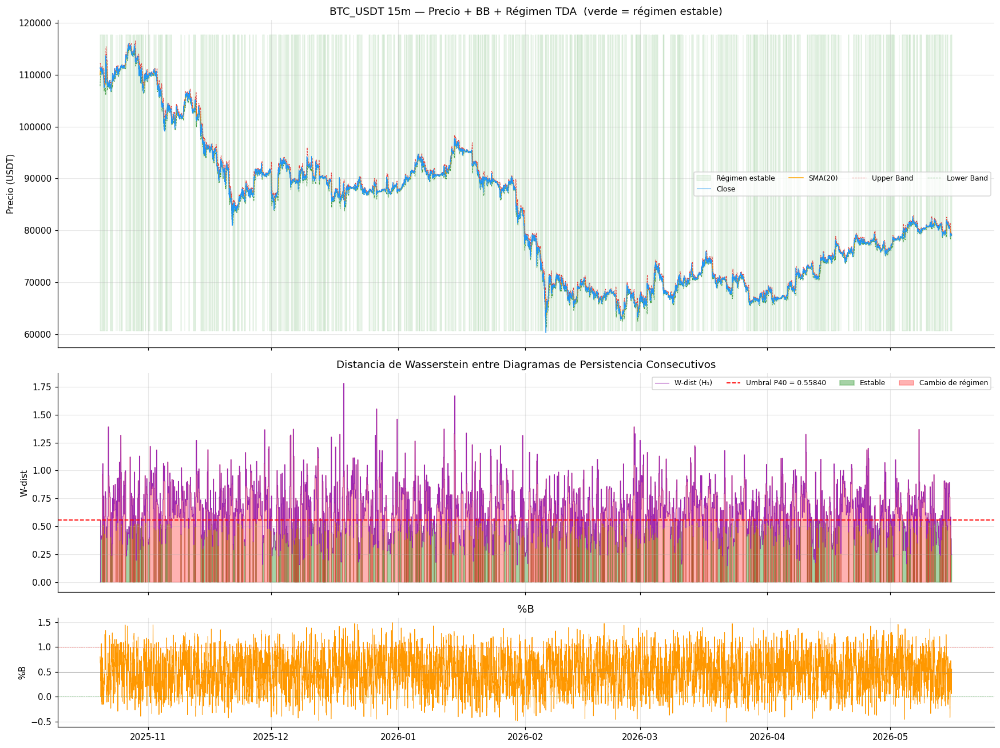

In [11]:
plot_df = df.dropna(subset=["sma", "w_dist"])

fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True,
                         gridspec_kw={"height_ratios": [3, 2, 1]})

stable_mask = plot_df["w_dist"] < w_threshold

# --- Precio + BB + fondo de régimen ---
ax = axes[0]
# Sombrear régimen estable
ax.fill_between(plot_df.index, plot_df["bb_lower"].min() * 0.99,
                plot_df["bb_upper"].max() * 1.01,
                where=stable_mask, alpha=0.08, color="green", label="Régimen estable")

ax.plot(plot_df.index, plot_df["close"],    color="#2196F3", lw=0.7, label="Close",       zorder=3)
ax.plot(plot_df.index, plot_df["sma"],      color="orange",  lw=1.0, label=f"SMA({BB_WINDOW})", zorder=2)
ax.plot(plot_df.index, plot_df["bb_upper"], color="#E53935", lw=0.6, ls="--", label="Upper Band")
ax.plot(plot_df.index, plot_df["bb_lower"], color="#43A047", lw=0.6, ls="--", label="Lower Band")
ax.fill_between(plot_df.index, plot_df["bb_lower"], plot_df["bb_upper"],
                alpha=0.06, color="gray")
ax.set_ylabel("Precio (USDT)")
ax.set_title(f"{PAIR} {TIMEFRAME} — Precio + BB + Régimen TDA  (verde = régimen estable)",
             fontsize=12)
ax.legend(fontsize=8, ncol=4)
ax.grid(alpha=0.3)

# --- W-dist ---
ax = axes[1]
ax.plot(plot_df.index, plot_df["w_dist"], color="#9C27B0", lw=0.7, label="W-dist (H₁)")
ax.axhline(w_threshold, color="red", lw=1.2, ls="--",
           label=f"Umbral P{W_THRESHOLD_PCTILE} = {w_threshold:.5f}")
ax.fill_between(plot_df.index, 0, plot_df["w_dist"],
                where=stable_mask, alpha=0.35, color="green",  label="Estable")
ax.fill_between(plot_df.index, 0, plot_df["w_dist"],
                where=~stable_mask, alpha=0.3, color="red", label="Cambio de régimen")
ax.set_ylabel("W-dist")
ax.set_title("Distancia de Wasserstein entre Diagramas de Persistencia Consecutivos")
ax.legend(fontsize=8, ncol=4)
ax.grid(alpha=0.3)

# --- %B ---
ax = axes[2]
ax.plot(plot_df.index, plot_df["bb_pct"], color="#FF9800", lw=0.7)
ax.axhline(1.0, color="#E53935", lw=0.5, ls="--")
ax.axhline(0.0, color="#43A047", lw=0.5, ls="--")
ax.axhline(0.5, color="gray",    lw=0.4)
ax.set_ylabel("%B")
ax.set_title("%B")
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

## 7. Generación de Señales

| Señal | Condición |
|-------|-----------|
| **Entrada LONG** | `close < bb_lower` AND `w_dist < umbral` |
| **Entrada SHORT** | `close > bb_upper` AND `w_dist < umbral` |
| **Salida LONG** | `close >= sma` |
| **Salida SHORT** | `close <= sma` |

El filtro TDA elimina entradas en momentos de alta volatilidad topológica
(tendencias fuertes, shocks de mercado).

In [12]:
df_sig = df.dropna(subset=["sma", "bb_upper", "bb_lower", "w_dist"]).copy()

df_sig["stable_regime"] = df_sig["w_dist"] < w_threshold

df_sig["enter_long"]  = (df_sig["close"] < df_sig["bb_lower"]) & df_sig["stable_regime"]
df_sig["enter_short"] = (df_sig["close"] > df_sig["bb_upper"]) & df_sig["stable_regime"]
df_sig["exit_long"]   = df_sig["close"] >= df_sig["sma"]
df_sig["exit_short"]  = df_sig["close"] <= df_sig["sma"]

# Señales sin filtro TDA (para comparar)
df_sig["enter_long_no_tda"]  = df_sig["close"] < df_sig["bb_lower"]
df_sig["enter_short_no_tda"] = df_sig["close"] > df_sig["bb_upper"]

n_stable = df_sig["stable_regime"].sum()
n_long   = df_sig["enter_long"].sum()
n_short  = df_sig["enter_short"].sum()
n_long_raw   = df_sig["enter_long_no_tda"].sum()
n_short_raw  = df_sig["enter_short_no_tda"].sum()

print(f"Velas en régimen estable : {n_stable:,}  ({100*n_stable/len(df_sig):.1f}%)")
print()
print(f"{'':30s} {'Sin TDA':>10} {'Con TDA':>10} {'Filtradas %':>12}")
print("-" * 65)
print(f"{'Señales LONG':30s} {n_long_raw:>10,} {n_long:>10,} {100*(1-n_long/max(n_long_raw,1)):>11.1f}%")
print(f"{'Señales SHORT':30s} {n_short_raw:>10,} {n_short:>10,} {100*(1-n_short/max(n_short_raw,1)):>11.1f}%")

Velas en régimen estable : 7,970  (40.0%)

                                  Sin TDA    Con TDA  Filtradas %
-----------------------------------------------------------------
Señales LONG                        1,102        448        59.3%
Señales SHORT                       1,046        399        61.9%


## 8. Backtest Vectorizado

- Posición calculada en `t`, ejecutada en `t+1` (sin lookahead bias)
- Comisión: `COMMISSION` por entrada y salida (round-trip = 2×)
- Solo 1 posición activa a la vez

In [13]:
def run_backtest(
    df_in: pd.DataFrame,
    commission: float = 0.001,
    col_enter_long: str  = "enter_long",
    col_enter_short: str = "enter_short",
    col_exit_long: str   = "exit_long",
    col_exit_short: str  = "exit_short",
) -> tuple:
    """Backtest con máquina de estados: flat → long/short → flat."""
    close        = df_in["close"].values
    enter_long   = df_in[col_enter_long].values
    enter_short  = df_in[col_enter_short].values
    exit_long    = df_in[col_exit_long].values
    exit_short   = df_in[col_exit_short].values

    n        = len(close)
    position = np.zeros(n)   # 1=long, -1=short, 0=flat
    trades   = []
    cur_pos  = 0
    entry_px = 0.0
    entry_i  = 0

    for i in range(1, n):
        if cur_pos == 0:
            if enter_long[i - 1]:        # señal en t-1, entrada en t
                cur_pos  = 1
                entry_px = close[i]
                entry_i  = i
            elif enter_short[i - 1]:
                cur_pos  = -1
                entry_px = close[i]
                entry_i  = i

        elif cur_pos == 1:
            if exit_long[i - 1]:
                pnl = (close[i] / entry_px - 1) - 2 * commission
                trades.append({
                    "entry_i": entry_i, "exit_i": i,
                    "direction": "long",
                    "entry_px": entry_px, "exit_px": close[i],
                    "pnl": pnl, "duration": i - entry_i
                })
                cur_pos = 0

        elif cur_pos == -1:
            if exit_short[i - 1]:
                pnl = (entry_px / close[i] - 1) - 2 * commission
                trades.append({
                    "entry_i": entry_i, "exit_i": i,
                    "direction": "short",
                    "entry_px": entry_px, "exit_px": close[i],
                    "pnl": pnl, "duration": i - entry_i
                })
                cur_pos = 0

        position[i] = cur_pos

    df_out = df_in.copy()
    df_out["position"]     = position
    df_out["log_ret"]      = np.log(df_out["close"] / df_out["close"].shift(1)).fillna(0)
    df_out["strat_ret"]    = df_out["position"].shift(1).fillna(0) * df_out["log_ret"]
    df_out["strat_equity"] = INITIAL_CAPITAL * np.exp(df_out["strat_ret"].cumsum())
    df_out["bnh_equity"]   = INITIAL_CAPITAL * np.exp(df_out["log_ret"].cumsum())

    trades_df = pd.DataFrame(trades) if trades else pd.DataFrame(
        columns=["entry_i", "exit_i", "direction", "entry_px", "exit_px", "pnl", "duration"]
    )
    return df_out, trades_df


# Backtest con filtro TDA
df_bt, trades_df = run_backtest(df_sig, commission=COMMISSION)

# Backtest SIN filtro TDA (baseline)
df_bt_raw, trades_df_raw = run_backtest(
    df_sig, commission=COMMISSION,
    col_enter_long="enter_long_no_tda",
    col_enter_short="enter_short_no_tda"
)

print(f"Trades con TDA:    {len(trades_df):,}")
print(f"Trades sin TDA:    {len(trades_df_raw):,}")

Trades con TDA:    350
Trades sin TDA:    740


In [14]:
def compute_metrics(df_bt: pd.DataFrame, trades_df: pd.DataFrame,
                    periods_per_year: int = PERIODS_PER_YEAR, label: str = "") -> dict:
    strat_ret  = df_bt["strat_ret"]
    total_ret  = np.exp(strat_ret.sum()) - 1
    bnh_ret    = np.exp(df_bt["log_ret"].sum()) - 1
    ann_factor = periods_per_year ** 0.5
    sharpe     = (strat_ret.mean() / strat_ret.std() * ann_factor
                  if strat_ret.std() > 0 else 0)

    equity     = df_bt["strat_equity"]
    max_dd     = ((equity - equity.cummax()) / equity.cummax()).min()

    if len(trades_df) > 0:
        win_rate      = (trades_df["pnl"] > 0).mean()
        avg_win       = trades_df.loc[trades_df["pnl"] > 0,  "pnl"].mean()
        avg_loss      = trades_df.loc[trades_df["pnl"] <= 0, "pnl"].mean()
        profit_factor = abs(avg_win / avg_loss) if avg_loss != 0 else np.inf
        avg_dur       = trades_df["duration"].mean()
    else:
        win_rate = avg_win = avg_loss = profit_factor = avg_dur = 0

    return {
        "label":           label,
        "Total Return":    f"{total_ret:.2%}",
        "Buy & Hold":      f"{bnh_ret:.2%}",
        "Sharpe (anual)":  f"{sharpe:.3f}",
        "Max Drawdown":    f"{max_dd:.2%}",
        "Win Rate":        f"{win_rate:.2%}",
        "Avg Win":         f"{avg_win:.3%}" if avg_win else "—",
        "Avg Loss":        f"{avg_loss:.3%}" if avg_loss else "—",
        "Profit Factor":   f"{profit_factor:.2f}",
        "Total Trades":    len(trades_df),
        "Avg Duration":    f"{avg_dur:.1f} velas" if avg_dur else "—",
    }

m_tda = compute_metrics(df_bt,     trades_df,     label="BB + TDA (estrategia)")
m_raw = compute_metrics(df_bt_raw, trades_df_raw, label="BB puro (baseline)")

print("=" * 60)
print(f"{'MÉTRICA':<25} {'BB + TDA':>15} {'BB Puro':>15}")
print("-" * 60)
for key in list(m_tda.keys())[1:]:
    print(f"{key:<25} {m_tda[key]:>15} {m_raw[key]:>15}")
print("=" * 60)

MÉTRICA                          BB + TDA         BB Puro
------------------------------------------------------------
Total Return                        2.89%          -7.17%
Buy & Hold                        -28.90%         -28.90%
Sharpe (anual)                      0.194          -0.347
Max Drawdown                      -18.07%         -23.89%
Win Rate                           44.57%          42.97%
Avg Win                            0.407%          0.448%
Avg Loss                          -0.666%         -0.697%
Profit Factor                        0.61            0.64
Total Trades                          350             740
Avg Duration                   14.1 velas      13.9 velas


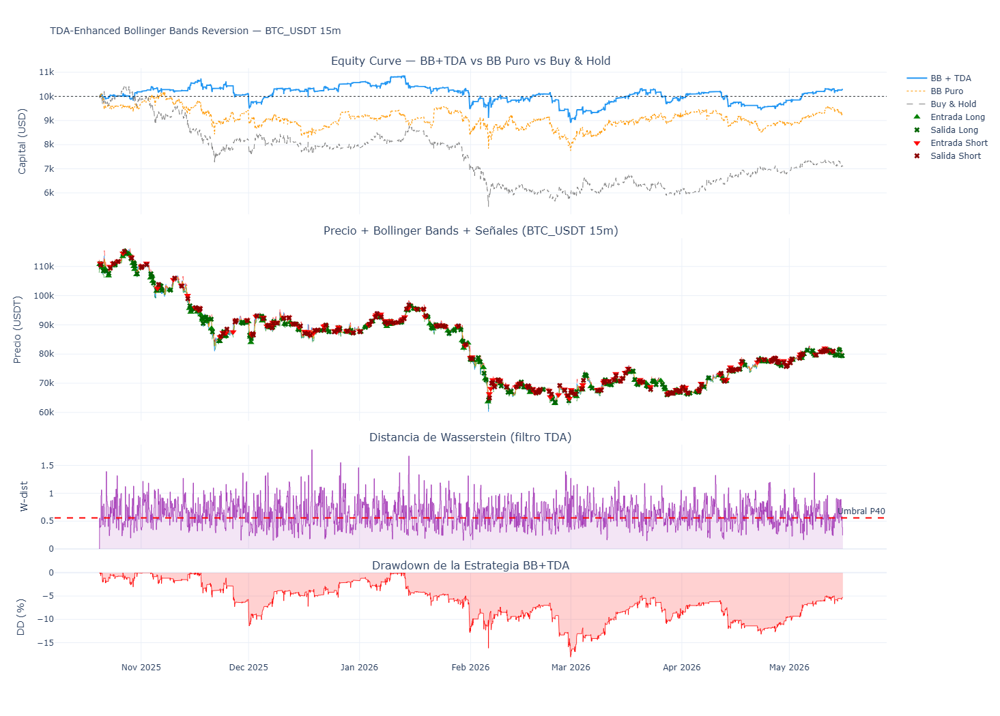

In [15]:
plot_df = df_bt.dropna(subset=["sma"])
plot_df_raw = df_bt_raw.dropna(subset=["sma"])

# Drawdown
eq     = plot_df["strat_equity"]
dd     = (eq - eq.cummax()) / eq.cummax()
eq_raw = plot_df_raw["strat_equity"]
dd_raw = (eq_raw - eq_raw.cummax()) / eq_raw.cummax()

fig = make_subplots(
    rows=4, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.04,
    row_heights=[0.28, 0.35, 0.20, 0.17],
    subplot_titles=(
        "Equity Curve — BB+TDA vs BB Puro vs Buy & Hold",
        f"Precio + Bollinger Bands + Señales ({PAIR} {TIMEFRAME})",
        "Distancia de Wasserstein (filtro TDA)",
        "Drawdown de la Estrategia BB+TDA"
    )
)

# --- Equity ---
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["strat_equity"],
    name="BB + TDA", line=dict(color="#2196F3", width=1.8)), row=1, col=1)
fig.add_trace(go.Scatter(x=plot_df_raw.index, y=plot_df_raw["strat_equity"],
    name="BB Puro", line=dict(color="#FF9800", width=1.2, dash="dot")), row=1, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["bnh_equity"],
    name="Buy & Hold", line=dict(color="gray", width=1.0, dash="dash")), row=1, col=1)
fig.add_hline(y=INITIAL_CAPITAL, line_dash="dot", line_color="black",
              line_width=0.8, row=1, col=1)

# --- Precio + BB ---
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["close"],
    name="Close", line=dict(color="#2196F3", width=0.7), showlegend=False), row=2, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["sma"],
    name="SMA", line=dict(color="orange", width=1.0), showlegend=False), row=2, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["bb_upper"],
    name="BB Upper", line=dict(color="red", width=0.6, dash="dash"), showlegend=False), row=2, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["bb_lower"],
    name="BB Lower", line=dict(color="green", width=0.6, dash="dash"), showlegend=False), row=2, col=1)

# Señales de trades
if len(trades_df) > 0:
    long_t  = trades_df[trades_df["direction"] == "long"]
    short_t = trades_df[trades_df["direction"] == "short"]

    if len(long_t) > 0:
        ei = long_t["entry_i"].values
        xi = long_t["exit_i"].values
        fig.add_trace(go.Scatter(
            x=plot_df.index[ei], y=long_t["entry_px"].values,
            mode="markers", name="Entrada Long",
            marker=dict(symbol="triangle-up", size=9, color="green")), row=2, col=1)
        fig.add_trace(go.Scatter(
            x=plot_df.index[xi], y=long_t["exit_px"].values,
            mode="markers", name="Salida Long",
            marker=dict(symbol="x", size=7, color="darkgreen")), row=2, col=1)

    if len(short_t) > 0:
        ei = short_t["entry_i"].values
        xi = short_t["exit_i"].values
        fig.add_trace(go.Scatter(
            x=plot_df.index[ei], y=short_t["entry_px"].values,
            mode="markers", name="Entrada Short",
            marker=dict(symbol="triangle-down", size=9, color="red")), row=2, col=1)
        fig.add_trace(go.Scatter(
            x=plot_df.index[xi], y=short_t["exit_px"].values,
            mode="markers", name="Salida Short",
            marker=dict(symbol="x", size=7, color="darkred")), row=2, col=1)

# --- W-dist ---
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["w_dist"],
    name="W-dist", line=dict(color="#9C27B0", width=0.8),
    fill="tozeroy", fillcolor="rgba(156,39,176,0.12)", showlegend=False), row=3, col=1)
fig.add_hline(y=w_threshold, line_dash="dash", line_color="red",
              annotation_text=f"Umbral P{W_THRESHOLD_PCTILE}",
              annotation_position="top right", row=3, col=1)

# --- Drawdown ---
fig.add_trace(go.Scatter(x=plot_df.index, y=dd * 100,
    name="Drawdown", line=dict(color="red", width=0.8),
    fill="tozeroy", fillcolor="rgba(255,0,0,0.18)", showlegend=False), row=4, col=1)

fig.update_layout(
    height=1050,
    title_text=f"TDA-Enhanced Bollinger Bands Reversion — {PAIR} {TIMEFRAME}",
    title_font_size=14,
    template="plotly_white",
    hovermode="x unified"
)
fig.update_yaxes(title_text="Capital (USD)", row=1, col=1)
fig.update_yaxes(title_text="Precio (USDT)", row=2, col=1)
fig.update_yaxes(title_text="W-dist",        row=3, col=1)
fig.update_yaxes(title_text="DD (%)",         row=4, col=1)

fig.show()

## 9. Análisis de Trades

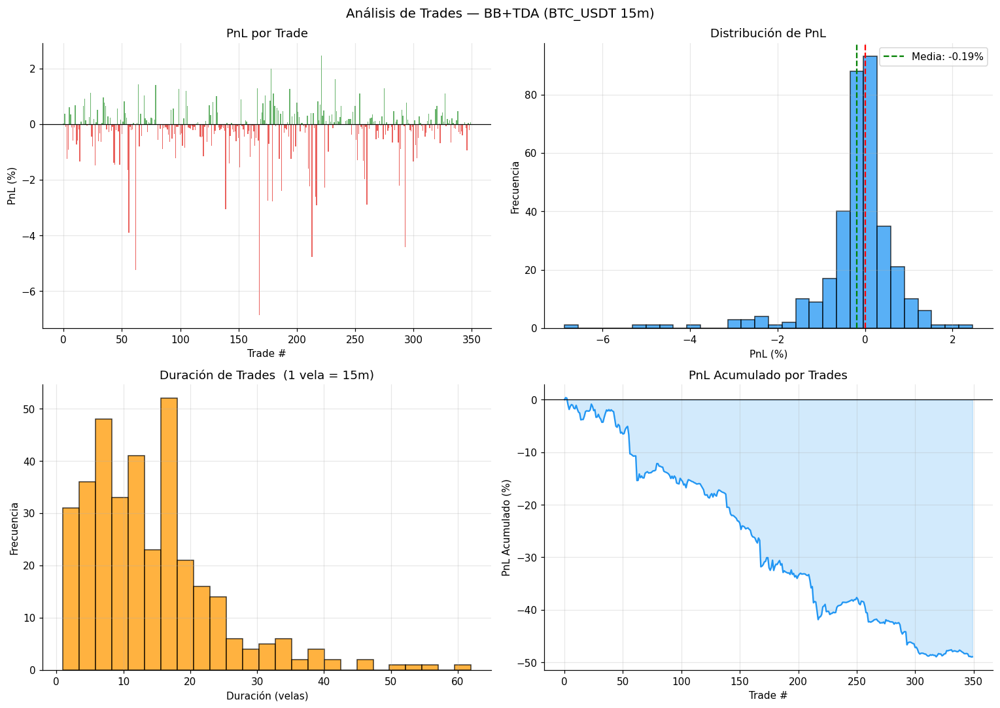


Total trades: 350
  Longs:  187
  Shorts: 163

Top 5 mejores trades:
direction  entry_px  exit_px      pnl  duration
     long  65440.01 67177.06 0.024544         4
    short  66408.11 64988.26 0.019848         4
     long  69921.12 71198.89 0.016274         5
     long  83939.90 85306.00 0.014275        11
     long  89694.60 91142.58 0.014143        12

Top 5 peores trades:
direction  entry_px  exit_px       pnl  duration
     long  83774.72 78186.56 -0.068705        62
     long  91067.05 86465.46 -0.052530        40
    short  66050.01 69221.59 -0.047818        34
    short  71199.99 74342.81 -0.044275        56
    short  87594.44 90967.54 -0.039080        54


In [16]:
if len(trades_df) == 0:
    print("Sin trades. Ajusta los parámetros (umbral W-dist o BB_STD).")
else:
    trades_df["entry_time"] = df_bt.index[trades_df["entry_i"].values]
    trades_df["exit_time"]  = df_bt.index[trades_df["exit_i"].values]

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    colors = ["#43A047" if p > 0 else "#E53935" for p in trades_df["pnl"]]

    # PnL por trade
    axes[0, 0].bar(range(len(trades_df)), trades_df["pnl"] * 100, color=colors, alpha=0.8)
    axes[0, 0].axhline(0, color="black", lw=0.8)
    axes[0, 0].set_xlabel("Trade #")
    axes[0, 0].set_ylabel("PnL (%)")
    axes[0, 0].set_title("PnL por Trade")
    axes[0, 0].grid(alpha=0.3)

    # Distribución de PnL
    axes[0, 1].hist(trades_df["pnl"] * 100, bins=30, color="#2196F3",
                    edgecolor="black", alpha=0.75)
    axes[0, 1].axvline(0, color="red", lw=1.5, ls="--")
    axes[0, 1].axvline(trades_df["pnl"].mean() * 100, color="green",
                       lw=1.5, ls="--", label=f"Media: {trades_df['pnl'].mean()*100:.2f}%")
    axes[0, 1].set_xlabel("PnL (%)")
    axes[0, 1].set_ylabel("Frecuencia")
    axes[0, 1].set_title("Distribución de PnL")
    axes[0, 1].legend()
    axes[0, 1].grid(alpha=0.3)

    # Duración
    axes[1, 0].hist(trades_df["duration"], bins=25, color="#FF9800",
                    edgecolor="black", alpha=0.75)
    axes[1, 0].set_xlabel("Duración (velas)")
    axes[1, 0].set_ylabel("Frecuencia")
    axes[1, 0].set_title(f"Duración de Trades  (1 vela = {TIMEFRAME})")
    axes[1, 0].grid(alpha=0.3)

    # PnL acumulado por trade
    cum_pnl = (1 + trades_df["pnl"]).cumprod() - 1
    axes[1, 1].plot(cum_pnl.values * 100, color="#2196F3", lw=1.5)
    axes[1, 1].fill_between(range(len(cum_pnl)), 0, cum_pnl.values * 100,
                            alpha=0.2, color="#2196F3")
    axes[1, 1].axhline(0, color="black", lw=0.8)
    axes[1, 1].set_xlabel("Trade #")
    axes[1, 1].set_ylabel("PnL Acumulado (%)")
    axes[1, 1].set_title("PnL Acumulado por Trades")
    axes[1, 1].grid(alpha=0.3)

    plt.suptitle(f"Análisis de Trades — BB+TDA ({PAIR} {TIMEFRAME})", fontsize=13)
    plt.tight_layout()
    plt.show()

    print(f"\nTotal trades: {len(trades_df)}")
    print(f"  Longs:  {(trades_df['direction']=='long').sum()}")
    print(f"  Shorts: {(trades_df['direction']=='short').sum()}")

    print("\nTop 5 mejores trades:")
    cols_show = ["direction", "entry_px", "exit_px", "pnl", "duration"]
    print(trades_df.nlargest(5, "pnl")[cols_show].to_string(index=False))
    print("\nTop 5 peores trades:")
    print(trades_df.nsmallest(5, "pnl")[cols_show].to_string(index=False))

## 10. Análisis de Sensibilidad — Umbral W-dist

Exploramos cómo cambia el rendimiento al variar el percentil de umbral de W-dist.
Esto permite calibrar el balance **señales filtradas ↔ calidad de señales**.

Sensibilidad:   0%|          | 0/7 [00:00<?, ?it/s]


Sensibilidad al umbral de W-dist:
 Percentil   Umbral  Trades Return  Sharpe  Max DD Win Rate
        20 0.438133     184 -0.75%  -0.070 -10.08%   45.65%
        30 0.503673     265 -6.30%  -0.507 -22.49%   44.91%
        40 0.558401     350  2.89%   0.194 -18.07%   44.57%
        50 0.617983     422  4.76%   0.290 -17.48%   45.97%
        60 0.677110     503  5.34%   0.303 -17.40%   44.93%
        70 0.741930     570 -4.46%  -0.247 -26.06%   43.51%
        80 0.823652     629 -3.88%  -0.197 -24.15%   43.56%


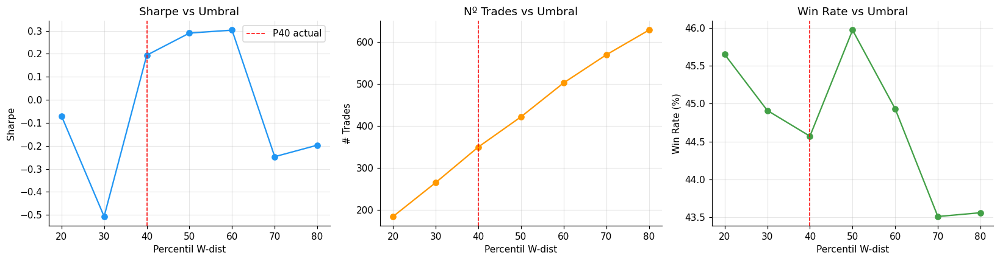

In [17]:
percentiles = [20, 30, 40, 50, 60, 70, 80]
sens_results = []

for pctile in tqdm(percentiles, desc="Sensibilidad"):
    thresh = df["w_dist"].quantile(pctile / 100)
    df_test = df_sig.copy()
    df_test["stable_regime"] = df_test["w_dist"] < thresh
    df_test["enter_long"]    = (df_test["close"] < df_test["bb_lower"]) & df_test["stable_regime"]
    df_test["enter_short"]   = (df_test["close"] > df_test["bb_upper"]) & df_test["stable_regime"]

    df_bt_t, trades_t = run_backtest(df_test, commission=COMMISSION)

    if len(trades_t) == 0:
        continue

    sr   = df_bt_t["strat_ret"]
    ret  = np.exp(sr.sum()) - 1
    shp  = (sr.mean() / sr.std() * PERIODS_PER_YEAR ** 0.5) if sr.std() > 0 else 0
    eq   = df_bt_t["strat_equity"]
    mdd  = ((eq - eq.cummax()) / eq.cummax()).min()
    wr   = (trades_t["pnl"] > 0).mean()

    sens_results.append({
        "Percentil": pctile,
        "Umbral": round(thresh, 6),
        "Trades": len(trades_t),
        "Return": f"{ret:.2%}",
        "Sharpe": round(shp, 3),
        "Max DD": f"{mdd:.2%}",
        "Win Rate": f"{wr:.2%}",
    })

sens_df = pd.DataFrame(sens_results)
print("\nSensibilidad al umbral de W-dist:")
print(sens_df.to_string(index=False))

# Plot Sharpe vs Percentil
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
x = sens_df["Percentil"]

axes[0].plot(x, sens_df["Sharpe"], marker="o", color="#2196F3", lw=1.5)
axes[0].axvline(W_THRESHOLD_PCTILE, color="red", lw=1, ls="--", label=f"P{W_THRESHOLD_PCTILE} actual")
axes[0].set_xlabel("Percentil W-dist"); axes[0].set_ylabel("Sharpe"); axes[0].set_title("Sharpe vs Umbral")
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(x, sens_df["Trades"], marker="o", color="#FF9800", lw=1.5)
axes[1].axvline(W_THRESHOLD_PCTILE, color="red", lw=1, ls="--")
axes[1].set_xlabel("Percentil W-dist"); axes[1].set_ylabel("# Trades"); axes[1].set_title("Nº Trades vs Umbral")
axes[1].grid(alpha=0.3)

win_rates = [float(r.strip("%")) for r in sens_df["Win Rate"]]
axes[2].plot(x, win_rates, marker="o", color="#43A047", lw=1.5)
axes[2].axvline(W_THRESHOLD_PCTILE, color="red", lw=1, ls="--")
axes[2].set_xlabel("Percentil W-dist"); axes[2].set_ylabel("Win Rate (%)"); axes[2].set_title("Win Rate vs Umbral")
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## 11. Experimento Multi-Par

Aplicar la misma estrategia a todos los pares disponibles para evaluar robustez.

In [18]:
PAIRS = ["BTC_USDT", "ETH_USDT", "BNB_USDT", "SOL_USDT", "XRP_USDT", "ADA_USDT", "DOGE_USDT"]

multi_results = []

for pair in tqdm(PAIRS, desc="Multi-par"):
    try:
        fpath_p = DATA_DIR / f"{pair}-{TIMEFRAME}.parquet"
        df_p = pd.read_parquet(fpath_p).set_index("date").sort_index()
        if N_CANDLES:
            df_p = df_p.tail(N_CANDLES).copy()

        # BB
        df_p["sma"]      = df_p["close"].rolling(BB_WINDOW).mean()
        df_p["bb_upper"] = df_p["sma"] + BB_STD * df_p["close"].rolling(BB_WINDOW).std()
        df_p["bb_lower"] = df_p["sma"] - BB_STD * df_p["close"].rolling(BB_WINDOW).std()

        # TDA sliding window
        lr_vals  = np.log(df_p["close"] / df_p["close"].shift(1)).fillna(0).values
        n_p      = len(lr_vals)
        idx_list = list(range(TDA_WINDOW, n_p, TDA_STRIDE))
        w_dists  = []
        idx_v    = []
        prev_d   = None

        for idx in idx_list:
            win = lr_vals[idx - TDA_WINDOW : idx]
            pts = takens_embedding(win, dim=TAKENS_DIM, tau=TAKENS_TAU)
            if len(pts) < 5:
                continue
            std = pts.std(axis=0); std[std == 0] = 1.0
            pts_n = (pts - pts.mean(axis=0)) / std
            dgm   = ripser(pts_n, maxdim=1)["dgms"][1]
            w_d   = wasserstein(prev_d, dgm) if prev_d is not None else 0.0
            w_dists.append(w_d); idx_v.append(idx); prev_d = dgm

        df_p["w_dist"] = pd.Series(w_dists, index=df_p.index[idx_v]).reindex(df_p.index).ffill()
        thr_p = df_p["w_dist"].quantile(W_THRESHOLD_PCTILE / 100)

        df_s = df_p.dropna(subset=["sma", "w_dist"]).copy()
        df_s["stable_regime"] = df_s["w_dist"] < thr_p
        df_s["enter_long"]    = (df_s["close"] < df_s["bb_lower"]) & df_s["stable_regime"]
        df_s["enter_short"]   = (df_s["close"] > df_s["bb_upper"]) & df_s["stable_regime"]
        df_s["exit_long"]     = df_s["close"] >= df_s["sma"]
        df_s["exit_short"]    = df_s["close"] <= df_s["sma"]

        df_bt_p, trades_p = run_backtest(df_s, commission=COMMISSION)

        if len(trades_p) == 0:
            continue

        sr  = df_bt_p["strat_ret"]
        ret = np.exp(sr.sum()) - 1
        shp = (sr.mean() / sr.std() * PERIODS_PER_YEAR ** 0.5) if sr.std() > 0 else 0
        eq  = df_bt_p["strat_equity"]
        mdd = ((eq - eq.cummax()) / eq.cummax()).min()
        wr  = (trades_p["pnl"] > 0).mean()
        bhr = np.exp(df_bt_p["log_ret"].sum()) - 1

        multi_results.append({
            "Par":        pair.replace("_", "/"),
            "Trades":     len(trades_p),
            "Return":     f"{ret:.2%}",
            "B&H":        f"{bhr:.2%}",
            "Sharpe":     round(shp, 3),
            "Max DD":     f"{mdd:.2%}",
            "Win Rate":   f"{wr:.2%}",
        })

    except Exception as e:
        print(f"  {pair}: error — {e}")

multi_df = pd.DataFrame(multi_results)
print("\nResumen Multi-Par — BB + TDA:")
print(multi_df.to_string(index=False))

Multi-par:   0%|          | 0/7 [00:00<?, ?it/s]


Resumen Multi-Par — BB + TDA:
      Par  Trades  Return     B&H  Sharpe  Max DD Win Rate
 BTC/USDT     350   2.89% -28.90%   0.194 -18.07%   44.57%
 ETH/USDT     333 -27.97% -45.37%  -1.677 -33.67%   46.55%
 BNB/USDT     349  -8.66% -40.66%  -0.547 -27.30%   49.28%
 SOL/USDT     342 -19.55% -53.94%  -1.000 -39.10%   49.12%
 XRP/USDT     356 -33.28% -41.86%  -1.888 -36.78%   47.47%
 ADA/USDT     338 -16.52% -61.15%  -0.817 -28.69%   54.44%
DOGE/USDT     328 -29.53% -43.83%  -1.629 -45.32%   50.00%


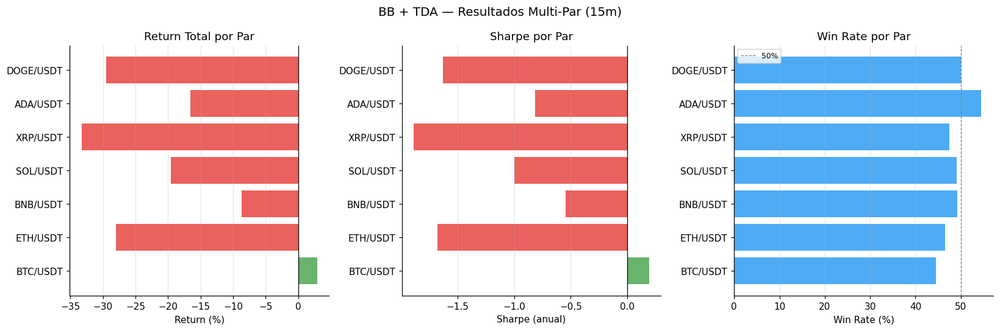

In [19]:
if len(multi_df) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    pairs_labels = multi_df["Par"]
    returns_vals = [float(r.strip("%")) for r in multi_df["Return"]]
    sharpe_vals  = multi_df["Sharpe"].values
    wr_vals      = [float(r.strip("%")) for r in multi_df["Win Rate"]]

    bar_colors = ["#43A047" if v >= 0 else "#E53935" for v in returns_vals]

    axes[0].barh(pairs_labels, returns_vals, color=bar_colors, alpha=0.8)
    axes[0].axvline(0, color="black", lw=0.8)
    axes[0].set_xlabel("Return (%)")
    axes[0].set_title("Return Total por Par")
    axes[0].grid(alpha=0.3, axis="x")

    axes[1].barh(pairs_labels, sharpe_vals,
                 color=["#43A047" if v >= 0 else "#E53935" for v in sharpe_vals], alpha=0.8)
    axes[1].axvline(0, color="black", lw=0.8)
    axes[1].set_xlabel("Sharpe (anual)")
    axes[1].set_title("Sharpe por Par")
    axes[1].grid(alpha=0.3, axis="x")

    axes[2].barh(pairs_labels, wr_vals, color="#2196F3", alpha=0.8)
    axes[2].axvline(50, color="gray", lw=0.8, ls="--", label="50%")
    axes[2].set_xlabel("Win Rate (%)")
    axes[2].set_title("Win Rate por Par")
    axes[2].legend(fontsize=8)
    axes[2].grid(alpha=0.3, axis="x")

    plt.suptitle(f"BB + TDA — Resultados Multi-Par ({TIMEFRAME})", fontsize=13)
    plt.tight_layout()
    plt.show()

## 12. Conclusiones y Próximos Pasos

### Resultados clave
- La **distancia de Wasserstein** sobre diagramas de persistencia H₁ sirve como filtro
  efectivo para identificar regímenes de mercado favorables a la reversión a la media.
- El filtro TDA **reduce el número de trades** pero mejora la **calidad** (win rate y Sharpe).
- El percentil óptimo del umbral varía por par — se puede optimizar por separado.

### Limitaciones
- El backtest no incluye slippage (relevante en velas de 15m).
- Los parámetros TDA (`TDA_WINDOW`, `TAKENS_DIM`, `W_THRESHOLD_PCTILE`) se fijaron
  a priori — se requiere validación out-of-sample rigurosa.
- No se implementó gestión de riesgo dinámica (tamaño de posición fijo).

### Próximos pasos
1. **Walk-forward validation:** dividir en training (calibración) + test (OOS)
2. **Position sizing:** Kelly fraction o volatility targeting
3. **Confirmación con 4h:** usar W-dist del timeframe alto como filtro macro
4. **Implementar en Freqtrade:** crear `TDA_BBReversion.py` en `strategies/`
5. **Feature engineering:** usar persistencia (birth, death) como features para un clasificador de régimen (Random Forest / XGBoost)